In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import pymysql
import datetime
plt.style.use('fivethirtyeight')
#plt.style.use('default')

from functools import reduce


pd.set_option('display.max_columns',None)
pd.set_option('display.min_rows', None)
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing   import OneHotEncoder, OrdinalEncoder, StandardScaler, LabelEncoder
from sklearn.impute          import SimpleImputer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
#from sklearn.pipeline        import Pipeline
from sklearn.compose         import ColumnTransformer
from sklearn.ensemble        import RandomForestClassifier
from sklearn.metrics         import classification_report, recall_score

from imblearn.over_sampling  import RandomOverSampler, SMOTE, ADASYN
from imblearn.pipeline       import Pipeline

import eli5
import shap
from sklearn.metrics import plot_confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE


In [2]:
df = pd.read_csv('df_final_owner.csv')

In [3]:
df.head()

,Unnamed: 0,account_id,district_id_x,stmt_frq,date_account,disp_id,client_id,type_disp,district_name,region,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,gender,birth_date,district_id_y,card_id,type_card,issued,loan_id,date_loan,loan_amount,loan_duration,monthly_loan_payment,loan_status,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
0,0,2350,18,monthly,1996-08-04,2841,2841,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1973-04-10,18,446.0,classic,1998-06-04,5451,1997-05-11,159744,48,3328.0,C,0.0,15.0,13.0,10.0,0.0,0.0,3.0,5.0,10.0,2.0,0.0,5.0,0.0,0.0,2.0,19.0,53598,79188,69002.000000,5,41964,105954,70175.285714,14,39875,105954,68155.266667,15,1
1,1,9156,18,monthly,1997-09-14,10963,11271,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,M,1937-12-08,18,NaN,NaN,NaN,6856,1998-12-01,163332,36,4537.0,C,4.0,34.0,28.0,11.0,0.0,0.0,0.0,23.0,32.0,0.0,0.0,23.0,0.0,0.0,6.0,37.0,17501,23801,18828.200000,5,2777,28615,16541.461538,13,2777,67680,24103.263158,19,1
2,2,10973,18,weekly,1993-04-20,13182,13490,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1969-05-25,18,NaN,NaN,NaN,7235,1993-10-13,154416,48,3217.0,A,2.0,16.0,14.0,10.0,0.0,0.0,0.0,6.0,16.0,0.0,0.0,6.0,0.0,0.0,4.0,22.0,20150,56033,42202.375000,8,20150,56033,41657.083333,12,20150,70024,44007.176471,17,1
3,3,2,1,monthly,1993-02-26,2,2,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1945-02-04,1,NaN,NaN,NaN,4959,1994-01-05,80952,24,3373.0,A,3.0,22.0,30.0,2.0,0.0,10.0,6.0,10.0,27.0,6.0,0.0,10.0,0.0,0.0,6.0,33.0,16859,47213,29349.888889,9,16859,47213,30791.533333,15,16859,47213,29830.000000,20,2
4,5,426,1,monthly,1993-11-29,512,512,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,F,1965-08-03,60,NaN,NaN,NaN,5060,1994-07-19,252060,60,4201.0,D,6.0,26.0,29.0,19.0,0.0,0.0,10.0,7.0,25.0,5.0,0.0,7.0,0.0,0.0,5.0,44.0,38545,96184,65952.818182,11,28524,96184,59215.909091,22,28524,96184,58548.483871,31,1


In [4]:
df.shape

(682, 64)

In [5]:
df.columns

Index(['Unnamed: 0', 'account_id', 'district_id_x', 'stmt_frq', 'date_account',
       'disp_id', 'client_id', 'type_disp', 'district_name', 'region',
       'population', 'nmu_lt499', 'nmu_500to1999', 'nmu_2000to9999',
       'nmu_gt10000', 'n_cty', 'ratio_urban', 'avg_salary', 'unemp_95',
       'unemp_96', 'nentrep_p1000', 'ncrimes_95', 'ncrimes_96', 'gender',
       'birth_date', 'district_id_y', 'card_id', 'type_card', 'issued',
       'loan_id', 'date_loan', 'loan_amount', 'loan_duration',
       'monthly_loan_payment', 'loan_status', 'num_trans_VYBER',
       'num_trans_credit', 'num_trans_withdrawal', 'num_ops_c_cash',
       'num_ops_cc_withdrawal', 'num_ops_col_bank', 'num_ops_remittance',
       'num_ops_unknown', 'num_ops_withdrawal_c', 'num_pay_household',
       'num_pay_insurance', 'num_pay_int_cred', 'num_pay_loan',
       'num_pay_sanc_int', 'num_pay_statement', 'num_pay_unknown', 'min1',
       'max1', 'mean1', 'count1', 'min2', 'max2', 'mean2', 'count2', 'min3',
    

In [6]:
#Remove duplicate or unwanted columns at this time
df = df.drop(columns = ['Unnamed: 0','district_id_y'])

In [7]:
df.shape 

(682, 62)

In [8]:
len(df['account_id'].unique())

# There are multiple people on one account

682

In [9]:
df.describe()

,account_id,district_id_x,disp_id,client_id,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,card_id,loan_id,loan_amount,loan_duration,monthly_loan_payment,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
count,682.000000,682.000000,682.000000,682.000000,6.820000e+02,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,674.000000,682.000000,682.000000,674.000000,682.000000,170.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000
mean,5824.162757,37.489736,7002.702346,7120.573314,2.720522e+05,39.673021,21.557185,5.648094,1.712610,5.406158,68.212903,9502.986804,2.842136,3.528431,121.218475,14861.621662,16390.818182,791.076471,6172.466276,151410.175953,36.492669,4190.664223,2.416422,32.123167,45.900293,14.413490,0.112903,3.797654,10.932551,13.912023,37.271261,5.765396,1.618768,13.912023,0.032258,0.120235,8.413490,50.577713,29573.346041,59409.287390,42930.182037,7.272727,25984.104106,65564.181818,43020.307344,14.175953,23432.636364,70211.193548,43280.419205,20.991202,1.212610
std,3283.512681,25.184326,3932.533759,4059.120567,3.583320e+05,33.673348,15.780258,4.588747,1.110404,2.868251,20.245469,1323.150982,1.881095,2.146775,23.366091,27072.441726,31299.743394,345.872296,682.579279,113372.406310,17.075219,2215.830344,3.182122,15.126857,30.377682,11.457987,0.749259,6.425682,14.922359,7.635100,22.112741,6.015455,4.251091,7.635100,0.176814,0.708808,5.451077,28.059104,14412.457973,28855.601952,19459.127894,2.462426,12950.915683,30402.963937,18362.998111,4.338281,12142.948581,31269.313555,17690.129369,6.213522,0.409454
min,2.000000,1.000000,2.000000,2.000000,4.282100e+04,0.000000,0.000000,0.000000,0.000000,1.000000,33.900000,8110.000000,0.200000,0.430000,81.000000,818.000000,888.000000,16.000000,4959.000000,4980.000000,12.000000,304.000000,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,-7631.000000,-1269.000000,-2706.250000,1.000000,-8470.000000,-950.000000,-3606.500000,1.000000,-17030.000000,-634.000000,-4434.035714,1.000000,1.000000
25%,2967.000000,13.000000,3582.250000,3582.250000,9.208400e+04,5.000000,10.000000,2.000000,1.000000,4.000000,52.000000,8544.000000,1.500000,1.960000,106.000000,2166.000000,2305.000000,551.250000,5577.500000,66732.000000,24.000000,2477.000000,0.000000,21.000000,23.000000,3.000000,0.000000,0.000000,0.000000,9.000000,19.000000,0.000000,0.000000,9.000000,0.000000,0.000000,4.000000,30.000000,19297.000000,38556.250000,28620.005952,6.000000,17102.000000,42584.500000,28739.552083,12.000000,15576.250000,45644.500000,29542.094427,17.000000,1.000000
50%,5738.500000,39.000000,6941.000000,6941.000000,1.246050e+05,35.000000,23.000000,5.000000,1.000000,6.000000,62.100000,8991.000000,2.700000,3.490000,116.000000,3732.500000,3868.000000,877.000000,6176.500000,116928.000000,36.000000,3934.000000,1.000000,30.000000,42.000000,13.000000,0.000000,0.000000,5.000000,13.000000,36.000000,4.000000,0.000000,13.000000,0.000000,0.000000,8.000000,47.000000,28294.000000,54385.000000,40583.055556,7.000000,24746.500000,60372.000000,41369.646617,14.000000,22497.000000,65911.000000,41325.010836,21.000000,1.000000
75%,8686.000000,60.000000,10403.000000,10711.000000,2.261220e+05,65.000000,33.000000,8.000000,2.0000

- 'A' stands for contract finished, no problems,
- 'B' stands for contract finished, loan not payed,
- 'C' stands for running contract, OK so far,
- 'D' stands for running contract, client in debt

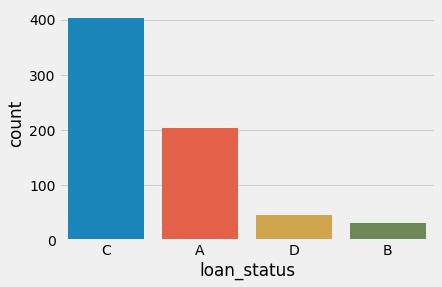

In [10]:
sns.countplot(x = 'loan_status', data = df);

We can see there are much higher amounts of successful loans (I.e. A & C). May need to resample.

In [11]:
# Let's convert the status (A, B, C, D) to target (0,1)
df.loc[df['loan_status'].isin(['A','C']),'loan_status'] = 0  # Accepted loans
df.loc[df['loan_status'].isin(['B','D']),'loan_status'] = 1  # Rejected loans
df.rename(columns = {'loan_status':'target'}, inplace=True)

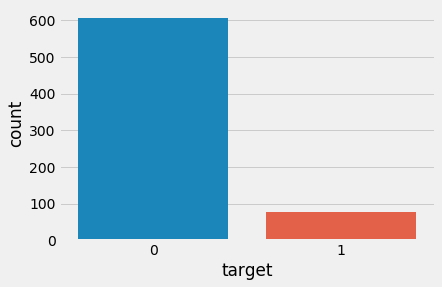

In [12]:
sns.countplot(x = 'target', data = df);

In [13]:
df.head()

,account_id,district_id_x,stmt_frq,date_account,disp_id,client_id,type_disp,district_name,region,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,gender,birth_date,card_id,type_card,issued,loan_id,date_loan,loan_amount,loan_duration,monthly_loan_payment,target,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
0,2350,18,monthly,1996-08-04,2841,2841,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1973-04-10,446.0,classic,1998-06-04,5451,1997-05-11,159744,48,3328.0,0,0.0,15.0,13.0,10.0,0.0,0.0,3.0,5.0,10.0,2.0,0.0,5.0,0.0,0.0,2.0,19.0,53598,79188,69002.000000,5,41964,105954,70175.285714,14,39875,105954,68155.266667,15,1
1,9156,18,monthly,1997-09-14,10963,11271,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,M,1937-12-08,NaN,NaN,NaN,6856,1998-12-01,163332,36,4537.0,0,4.0,34.0,28.0,11.0,0.0,0.0,0.0,23.0,32.0,0.0,0.0,23.0,0.0,0.0,6.0,37.0,17501,23801,18828.200000,5,2777,28615,16541.461538,13,2777,67680,24103.263158,19,1
2,10973,18,weekly,1993-04-20,13182,13490,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1969-05-25,NaN,NaN,NaN,7235,1993-10-13,154416,48,3217.0,0,2.0,16.0,14.0,10.0,0.0,0.0,0.0,6.0,16.0,0.0,0.0,6.0,0.0,0.0,4.0,22.0,20150,56033,42202.375000,8,20150,56033,41657.083333,12,20150,70024,44007.176471,17,1
3,2,1,monthly,1993-02-26,2,2,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1945-02-04,NaN,NaN,NaN,4959,1994-01-05,80952,24,3373.0,0,3.0,22.0,30.0,2.0,0.0,10.0,6.0,10.0,27.0,6.0,0.0,10.0,0.0,0.0,6.0,33.0,16859,47213,29349.888889,9,16859,47213,30791.533333,15,16859,47213,29830.000000,20,2
4,426,1,monthly,1993-11-29,512,512,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,F,1965-08-03,NaN,NaN,NaN,5060,1994-07-19,252060,60,4201.0,1,6.0,26.0,29.0,19.0,0.0,0.0,10.0,7.0,25.0,5.0,0.0,7.0,0.0,0.0,5.0,44.0,38545,96184,65952.818182,11,28524,96184,59215.909091,22,28524,96184,58548.483871,31,1


In [14]:
#Let's classify all of our columns for preprocessing

#check unique values for each variable
df_cols = list(df.columns)
for num in df_cols:
    print(f'{num}: {df[num].nunique()} - {df[num].dtype}')

account_id: 682 - int64
district_id_x: 77 - int64
stmt_frq: 3 - object
date_account: 557 - object
disp_id: 682 - int64
client_id: 682 - int64
type_disp: 1 - object
district_name: 77 - object
region: 8 - object
population: 77 - int64
nmu_lt499: 53 - int64
nmu_500to1999: 36 - int64
nmu_2000to9999: 17 - int64
nmu_gt10000: 6 - int64
n_cty: 11 - int64
ratio_urban: 70 - float64
avg_salary: 76 - int64
unemp_95: 41 - float64
unemp_96: 73 - float64
nentrep_p1000: 44 - int64
ncrimes_95: 75 - float64
ncrimes_96: 76 - int64
gender: 2 - object
birth_date: 655 - object
card_id: 170 - float64
type_card: 3 - object
issued: 160 - object
loan_id: 682 - int64
date_loan: 559 - object
loan_amount: 645 - int64
loan_duration: 5 - int64
monthly_loan_payment: 577 - float64
target: 2 - object
num_trans_VYBER: 18 - float64
num_trans_credit: 72 - float64
num_trans_withdrawal: 122 - float64
num_ops_c_cash: 48 - float64
num_ops_cc_withdrawal: 10 - float64
num_ops_col_bank: 22 - float64
num_ops_remittance: 61 - floa

In [15]:
df.info()

#only characteristics about cards have missing values; we'll omit them in this case

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 682 entries, 0 to 681
Data columns (total 62 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   account_id             682 non-null    int64  
 1   district_id_x          682 non-null    int64  
 2   stmt_frq               682 non-null    object 
 3   date_account           682 non-null    object 
 4   disp_id                682 non-null    int64  
 5   client_id              682 non-null    int64  
 6   type_disp              682 non-null    object 
 7   district_name          682 non-null    object 
 8   region                 682 non-null    object 
 9   population             682 non-null    int64  
 10  nmu_lt499              682 non-null    int64  
 11  nmu_500to1999          682 non-null    int64  
 12  nmu_2000to9999         682 non-null    int64  
 13  nmu_gt10000            682 non-null    int64  
 14  n_cty                  682 non-null    int64  
 15  ratio_

In [16]:
df.describe()

,account_id,district_id_x,disp_id,client_id,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,card_id,loan_id,loan_amount,loan_duration,monthly_loan_payment,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
count,682.000000,682.000000,682.000000,682.000000,6.820000e+02,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,674.000000,682.000000,682.000000,674.000000,682.000000,170.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000
mean,5824.162757,37.489736,7002.702346,7120.573314,2.720522e+05,39.673021,21.557185,5.648094,1.712610,5.406158,68.212903,9502.986804,2.842136,3.528431,121.218475,14861.621662,16390.818182,791.076471,6172.466276,151410.175953,36.492669,4190.664223,2.416422,32.123167,45.900293,14.413490,0.112903,3.797654,10.932551,13.912023,37.271261,5.765396,1.618768,13.912023,0.032258,0.120235,8.413490,50.577713,29573.346041,59409.287390,42930.182037,7.272727,25984.104106,65564.181818,43020.307344,14.175953,23432.636364,70211.193548,43280.419205,20.991202,1.212610
std,3283.512681,25.184326,3932.533759,4059.120567,3.583320e+05,33.673348,15.780258,4.588747,1.110404,2.868251,20.245469,1323.150982,1.881095,2.146775,23.366091,27072.441726,31299.743394,345.872296,682.579279,113372.406310,17.075219,2215.830344,3.182122,15.126857,30.377682,11.457987,0.749259,6.425682,14.922359,7.635100,22.112741,6.015455,4.251091,7.635100,0.176814,0.708808,5.451077,28.059104,14412.457973,28855.601952,19459.127894,2.462426,12950.915683,30402.963937,18362.998111,4.338281,12142.948581,31269.313555,17690.129369,6.213522,0.409454
min,2.000000,1.000000,2.000000,2.000000,4.282100e+04,0.000000,0.000000,0.000000,0.000000,1.000000,33.900000,8110.000000,0.200000,0.430000,81.000000,818.000000,888.000000,16.000000,4959.000000,4980.000000,12.000000,304.000000,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,-7631.000000,-1269.000000,-2706.250000,1.000000,-8470.000000,-950.000000,-3606.500000,1.000000,-17030.000000,-634.000000,-4434.035714,1.000000,1.000000
25%,2967.000000,13.000000,3582.250000,3582.250000,9.208400e+04,5.000000,10.000000,2.000000,1.000000,4.000000,52.000000,8544.000000,1.500000,1.960000,106.000000,2166.000000,2305.000000,551.250000,5577.500000,66732.000000,24.000000,2477.000000,0.000000,21.000000,23.000000,3.000000,0.000000,0.000000,0.000000,9.000000,19.000000,0.000000,0.000000,9.000000,0.000000,0.000000,4.000000,30.000000,19297.000000,38556.250000,28620.005952,6.000000,17102.000000,42584.500000,28739.552083,12.000000,15576.250000,45644.500000,29542.094427,17.000000,1.000000
50%,5738.500000,39.000000,6941.000000,6941.000000,1.246050e+05,35.000000,23.000000,5.000000,1.000000,6.000000,62.100000,8991.000000,2.700000,3.490000,116.000000,3732.500000,3868.000000,877.000000,6176.500000,116928.000000,36.000000,3934.000000,1.000000,30.000000,42.000000,13.000000,0.000000,0.000000,5.000000,13.000000,36.000000,4.000000,0.000000,13.000000,0.000000,0.000000,8.000000,47.000000,28294.000000,54385.000000,40583.055556,7.000000,24746.500000,60372.000000,41369.646617,14.000000,22497.000000,65911.000000,41325.010836,21.000000,1.000000
75%,8686.000000,60.000000,10403.000000,10711.000000,2.261220e+05,65.000000,33.000000,8.000000,2.0000

In [17]:
#https://towardsdatascience.com/7-data-types-a-better-way-to-think-about-data-types-for-machine-learning-939fae99a689

useless_var = ['account_id',
               'district_id_x', 
               'disp_id','client_id',
               'type_disp',
               'district_name',
               #'card_id', #missing
               'loan_id']

nominal_var = ['stmt_frq',
               'region',
               #'type_card' #missing
              ]

binary_var = ['gender',
              'target'
             ]

time_var = ['date_account',
            'birth_date',
            #'issued', #missing 
            'date_loan'
           ]

count_var = [#'population',
             #'nmu_lt499',
             #'nmu_500to1999',
             #'nmu_2000to9999',
             #'nmu_gt10000',
             #'n_cty',
             'nentrep_p1000',
             #'ncrimes_95', 
             #'ncrimes_96',
             'loan_duration',
             'num_trans_VYBER',
             'num_trans_credit',
             'num_trans_withdrawal',
             'num_ops_c_cash',
             'num_ops_cc_withdrawal',
             'num_ops_col_bank',
             'num_ops_remittance',
             'num_ops_unknown',
             'num_ops_withdrawal_c',
             'num_pay_household',
             'num_pay_insurance',
             'num_pay_int_cred',
             'num_pay_loan',
             'num_pay_sanc_int',
             'num_pay_statement',
             'num_pay_unknown',
             'count1',
             'count2',
             'count3',
             ]

interval_var = ['ratio_urban',
                'avg_salary',
                #'unemp_95',
                #'unemp_96',
                'loan_amount',
                'monthly_loan_payment',
                'min1',
                'max1',
                'mean1',
                'min2',
                'max2',
                'mean2',
                'min3',
                'max3',
                'mean3'
                ]

In [18]:
num_var = count_var + interval_var

bin_var = ['gender']

nom_var = nominal_var + bin_var

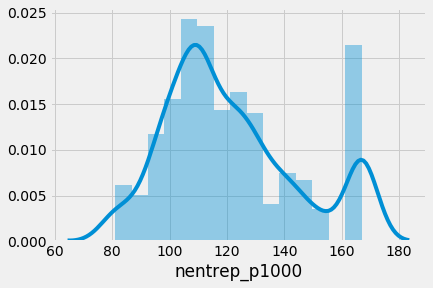

In [19]:
sns.distplot(df.nentrep_p1000)

This graph is for nentrep_p1000


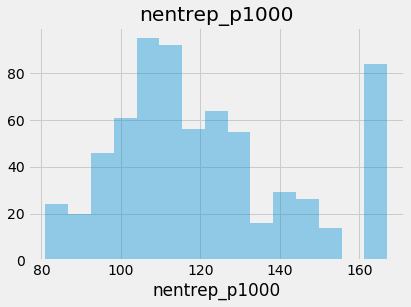

This graph is for loan_duration


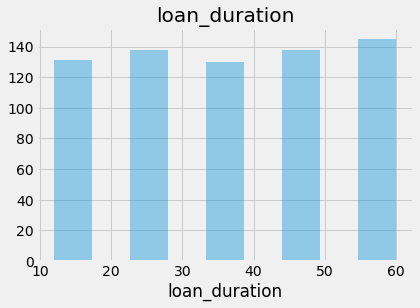

This graph is for num_trans_VYBER


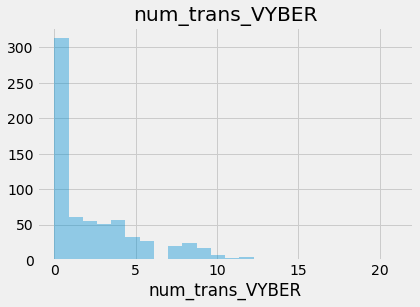

This graph is for num_trans_credit


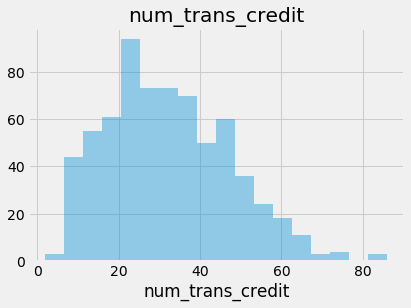

This graph is for num_trans_withdrawal


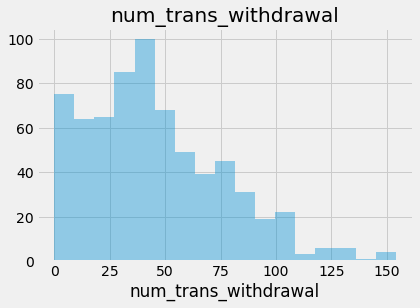

This graph is for num_ops_c_cash


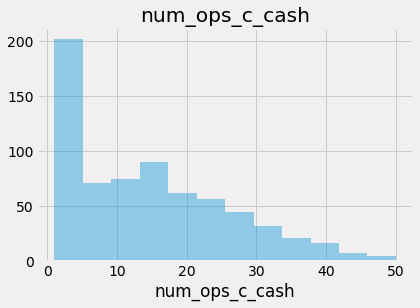

This graph is for num_ops_cc_withdrawal


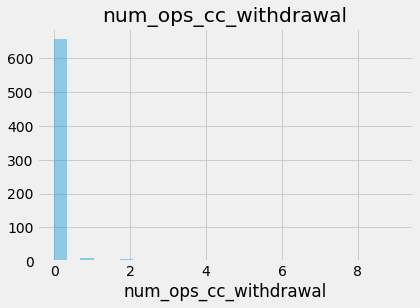

This graph is for num_ops_col_bank


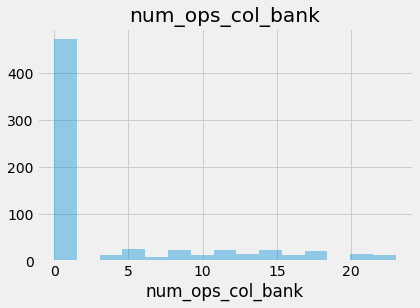

This graph is for num_ops_remittance


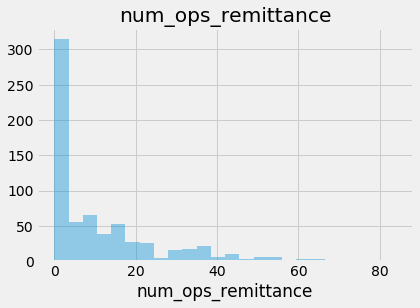

This graph is for num_ops_unknown


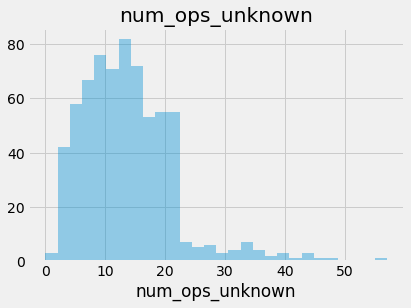

This graph is for num_ops_withdrawal_c


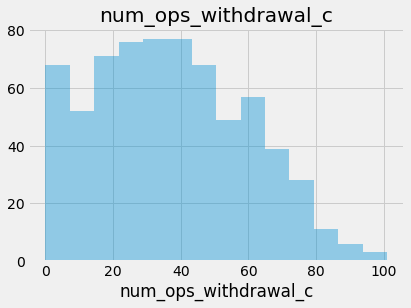

This graph is for num_pay_household


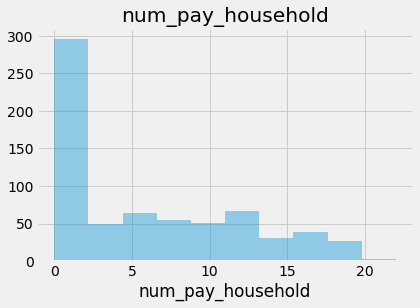

This graph is for num_pay_insurance


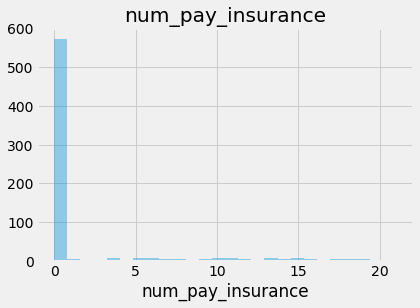

This graph is for num_pay_int_cred


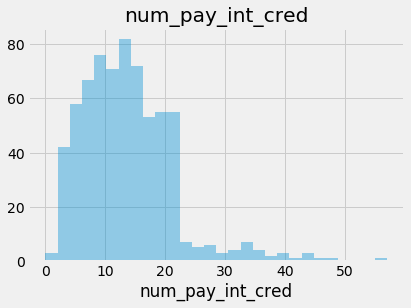

This graph is for num_pay_loan


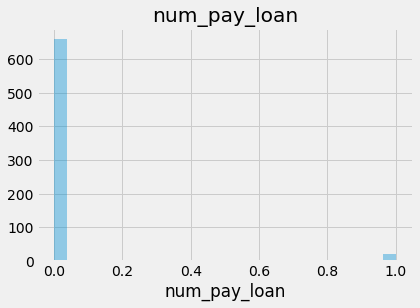

This graph is for num_pay_sanc_int


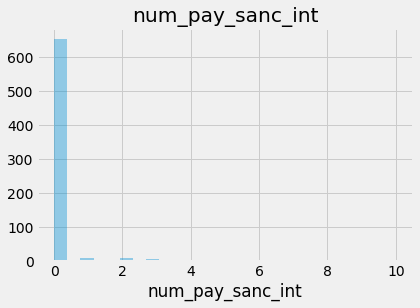

This graph is for num_pay_statement


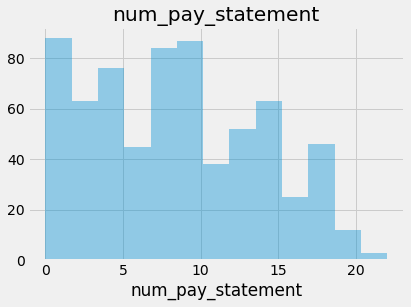

This graph is for num_pay_unknown


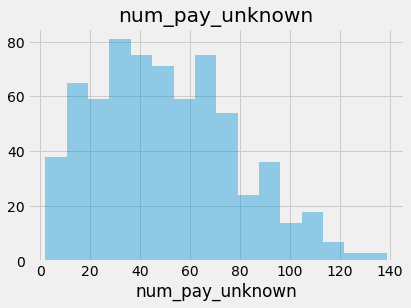

This graph is for count1


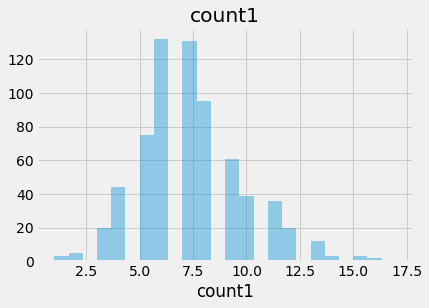

This graph is for count2


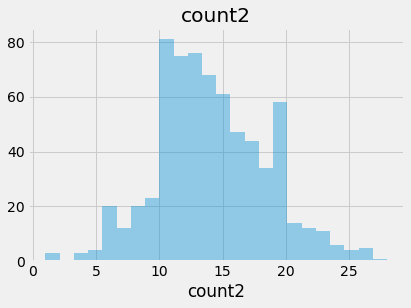

This graph is for count3


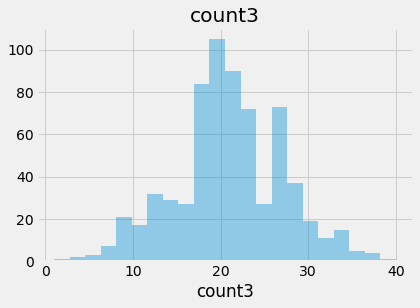

This graph is for ratio_urban


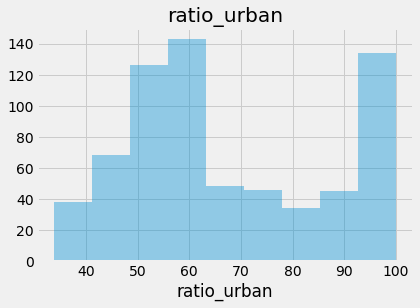

This graph is for avg_salary


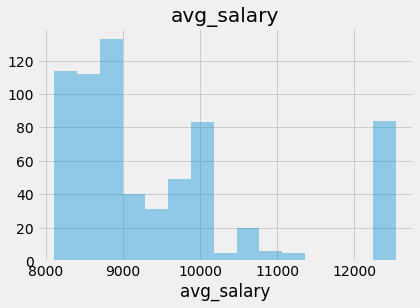

This graph is for loan_amount


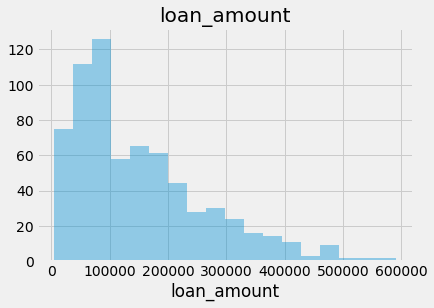

This graph is for monthly_loan_payment


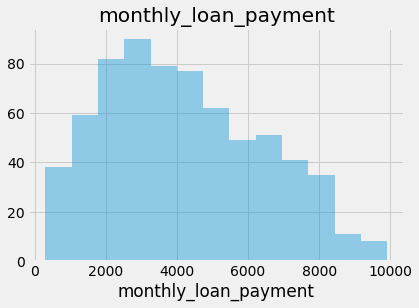

This graph is for min1


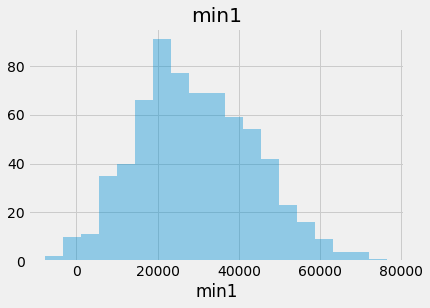

This graph is for max1


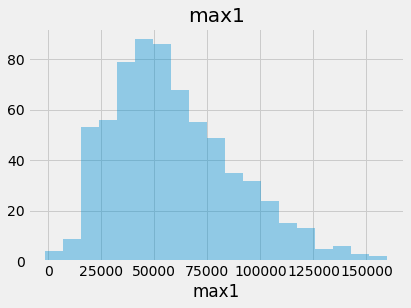

This graph is for mean1


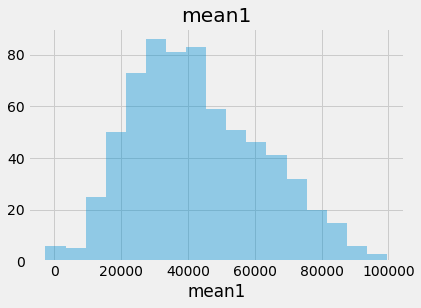

This graph is for min2


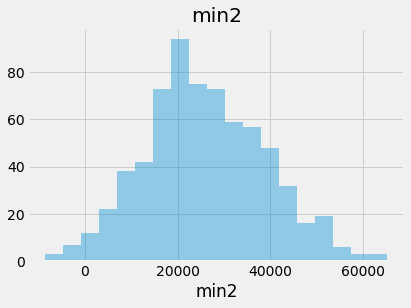

This graph is for max2


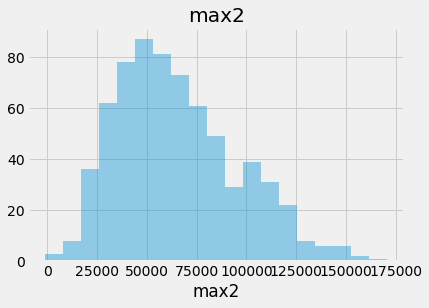

This graph is for mean2


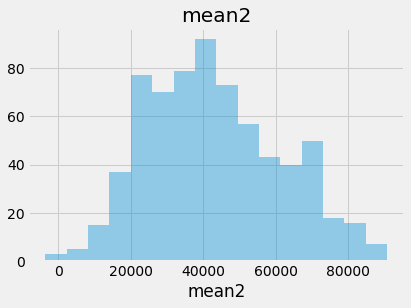

This graph is for min3


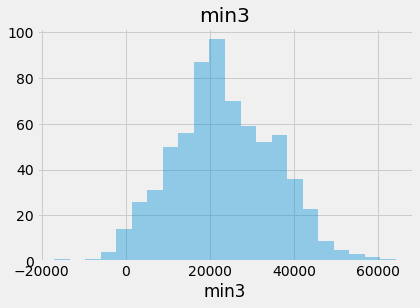

This graph is for max3


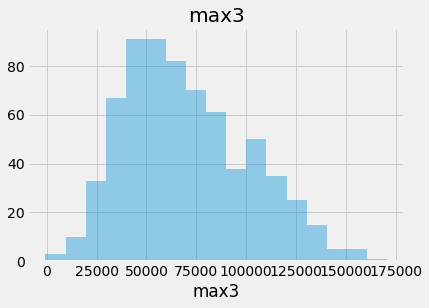

This graph is for mean3


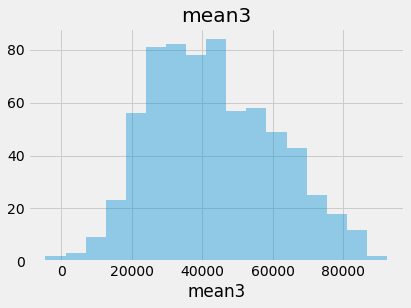

In [20]:
for col in num_var:
    print(f'This graph is for {col}')    
    sns.distplot(df[col], kde=False)
    
    #fig, axes = plt.subplots(figsize=(20, 10))
    #plt.gcf().subplots_adjust(bottom=0.15,left=0.1)

    #sns.set(font_scale = 4)
    #plt.style.use('fivethirtyeight')
    #sns.kdeplot(df.loc[df['target']==0, col],label='Accepted Loans')
    #sns.kdeplot(df.loc[df['target']==1, col],label='Rejected Loans')
    #plt.xlim(left=df[col].min(), right=df[col].max())
    #plt.xlabel(' ')
    #plt.ylabel(' ')
    plt.title(col)
    plt.show()

In [21]:
df['stmt_frq'].unique()

array(['monthly', 'weekly', 'after_trans'], dtype=object)

In [22]:
df['region'].unique()

array(['south Bohemia', 'Prague', 'central Bohemia', 'east Bohemia',
       'south Moravia', 'north Moravia', 'west Bohemia', 'north Bohemia'],
      dtype=object)

In [23]:
df['gender'].unique()

array(['F', 'M'], dtype=object)

## Transforming all the data

In [24]:
nominal_transformer = OneHotEncoder([['monthly', 'weekly', 'after_trans'],['south Bohemia', 'Prague', 'central Bohemia', 'east Bohemia','south Moravia', 'north Moravia', 'west Bohemia', 'north Bohemia'], ['F', 'M']])

preprocessor = ColumnTransformer(transformers = [
                                                ('continuous','passthrough',num_var),
                                                ('onehot', nominal_transformer, nom_var),
                                                ],
                                 remainder = 'drop')

In [25]:
preprocessor

ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('continuous', 'passthrough',
                                 ['nentrep_p1000', 'loan_duration',
                                  'num_trans_VYBER', 'num_trans_credit',
                                  'num_trans_withdrawal', 'num_ops_c_cash',
                                  'num_ops_cc_withdrawal', 'num_ops_col_bank',
                                  'num_ops_remittance', 'num_ops_unknown',
                                  'num_ops_withdrawal_c',...
                                  'monthly_loan_payment', 'min1', 'max1',
                                  'mean1', 'min2', 'max2', ...]),
                                ('onehot',
                                 OneHotEncoder(categories=[['monthly', 'weekly',
                                                            'after_trans'],
                                                   

In [26]:
# Assign variables
X = df[num_var + nom_var]
y = df['target']

# Then split the remaining into training and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y,
                                                    test_size = 0.2,
                                                    random_state = 42)

In [27]:
# Fitting the preprocessor
X_train_transformed = preprocessor.fit_transform(X_train)

# Transform the input validation and test sets
X_test_transformed = preprocessor.transform(X_test)

In [28]:
# why we name the transformers
preprocessor.named_transformers_.keys()

dict_keys(['continuous', 'onehot'])

In [29]:
# Transform target
target_transformer = LabelEncoder()

# fit transformer 
target_transformer.fit(y_train)

target_transformer.classes_

array([0, 1], dtype=object)

In [30]:
# Transform all the target sets
y_train_transformed = target_transformer.transform(y_train)
y_test_transformed = target_transformer.transform(y_test)

In [31]:
y_train.value_counts()

0    481
1     64
Name: target, dtype: int64

## Logistic Regression

In [32]:
#Feature Scaling using Scaler essentially removing the mean and scaling to unit variance. 
#Machine Learning algorithms perform better when input numerical variables fall within a similar scale. 

#Scale model 
scaler = StandardScaler()
#fit scaler
scaler.fit(X_train_transformed)
#transform the data
X_train_scale = scaler.transform(X_train_transformed)
X_test_scale = scaler.transform(X_test_transformed)

# # Feature extraction
# model = LogisticRegression()
# rfe = RFE(model, 8)
# fit = rfe.fit(X_train_scale, y_train_transformed)
# print("Num Features: %s" % (fit.n_features_))
# print("Selected Features: %s" % (fit.support_))
# print("Feature Ranking: %s" % (fit.ranking_))
# list(zip(X.columns,fit.ranking_))

#Set model (Going to be using the same data as model 3)
clf = LogisticRegression(penalty = 'l1',
                         solver='saga',
                         class_weight='balanced',
                         max_iter=1000, #changed interations from default=100
                         random_state=42,
                         C=1)
clf.fit(X_train_scale,y_train_transformed)

y_train_pred_scale = clf.predict(X_train_scale) 
y_test_pred_scale = clf.predict(X_test_scale)

#print(classification_report(y_train_transformed,y_train_pred_scale))

print(classification_report(y_test_transformed,y_test_pred_scale))

              precision    recall  f1-score   support

           0       0.97      0.78      0.86       125
           1       0.24      0.75      0.37        12

    accuracy                           0.77       137
   macro avg       0.61      0.76      0.61       137
weighted avg       0.91      0.77      0.82       137



## Putting all the transformed X data back into a dataframe

In [33]:
preprocessor.named_transformers_

{'continuous': 'passthrough',
 'onehot': OneHotEncoder(categories=[['monthly', 'weekly', 'after_trans'],
                           ['south Bohemia', 'Prague', 'central Bohemia',
                            'east Bohemia', 'south Moravia', 'north Moravia',
                            'west Bohemia', 'north Bohemia'],
                           ['F', 'M']],
               drop=None, dtype=<class 'numpy.float64'>, handle_unknown='error',
               sparse=True)}

In [34]:
# one_hot_columns = preprocessor.named_transformers_.onehot.get_feature_names
one_hot_columns = preprocessor.named_transformers_.onehot.get_feature_names()

In [35]:
transformed_columns = num_var + list(one_hot_columns) 

In [36]:
transformed_columns

['nentrep_p1000',
 'loan_duration',
 'num_trans_VYBER',
 'num_trans_credit',
 'num_trans_withdrawal',
 'num_ops_c_cash',
 'num_ops_cc_withdrawal',
 'num_ops_col_bank',
 'num_ops_remittance',
 'num_ops_unknown',
 'num_ops_withdrawal_c',
 'num_pay_household',
 'num_pay_insurance',
 'num_pay_int_cred',
 'num_pay_loan',
 'num_pay_sanc_int',
 'num_pay_statement',
 'num_pay_unknown',
 'count1',
 'count2',
 'count3',
 'ratio_urban',
 'avg_salary',
 'loan_amount',
 'monthly_loan_payment',
 'min1',
 'max1',
 'mean1',
 'min2',
 'max2',
 'mean2',
 'min3',
 'max3',
 'mean3',
 'x0_monthly',
 'x0_weekly',
 'x0_after_trans',
 'x1_south Bohemia',
 'x1_Prague',
 'x1_central Bohemia',
 'x1_east Bohemia',
 'x1_south Moravia',
 'x1_north Moravia',
 'x1_west Bohemia',
 'x1_north Bohemia',
 'x2_F',
 'x2_M']

In [37]:
len(transformed_columns)

47

In [38]:
X_train_transformed.shape #Nice! They match

(545, 47)

In [39]:
X_train_transform_df = pd.DataFrame(X_train_transformed, columns = transformed_columns)
X_test_transform_df = pd.DataFrame(X_test_transformed, columns = transformed_columns)

In [40]:
X_train_transform_df.head()

,nentrep_p1000,loan_duration,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,count1,count2,count3,ratio_urban,avg_salary,loan_amount,monthly_loan_payment,min1,max1,mean1,min2,max2,mean2,min3,max3,mean3,x0_monthly,x0_weekly,x0_after_trans,x1_south Bohemia,x1_Prague,x1_central Bohemia,x1_east Bohemia,x1_south Moravia,x1_north Moravia,x1_west Bohemia,x1_north Bohemia,x2_F,x2_M
0,131.0,48.0,0.0,30.0,30.0,17.0,0.0,0.0,6.0,13.0,24.0,6.0,0.0,13.0,0.0,0.0,6.0,35.0,7.0,11.0,17.0,100.0,10787.0,249312.0,5194.0,26707.0,74891.0,42923.714286,5850.0,74891.0,31326.909091,5834.0,74891.0,26425.529412,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,108.0,60.0,6.0,42.0,52.0,29.0,0.0,0.0,0.0,13.0,58.0,0.0,0.0,13.0,0.0,1.0,12.0,74.0,6.0,13.0,20.0,61.9,8363.0,290700.0,4845.0,-2825.0,11575.0,231.666667,-2825.0,19593.0,6841.153846,-2825.0,47448.0,16704.400000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,112.0,36.0,0.0,37.0,38.0,24.0,0.0,0.0,8.0,13.0,30.0,8.0,0.0,13.0,0.0,0.0,9.0,45.0,6.0,14.0,24.0,36.9,8594.0,156672.0,4352.0,12686.0,23286.0,19892.500000,11419.0,23286.0,18605.857143,11419.0,26490.0,19649.375000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,167.0,12.0,8.0,51.0,62.0,33.0,0.0,0.0,0.0,18.0,70.0,0.0,0.0,18.0,0.0,0.0,12.0,91.0,8.0,16.0,21.0,100.0,12541.0,31248.0,2604.0,22786.0,53922.0,40312.625000,22786.0,66092.0,47297.937500,22786.0,66092.0,48562.333333,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,118.0,36.0,0.0,11.0,6.0,1.0,0.0,5.0,0.0,5.0,6.0,0.0,0.0,5.0,0.0,0.0,1.0,11.0,5.0,8.0,11.0,81.0,9272.0,162468.0,4513.0,49363.0,76439.0,70071.200000,42932.0,83863.0,70087.125000,37704.0,83863.0,66201.181818,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


In [41]:
rf_model_1 = RandomForestClassifier(verbose = 1, random_state = 42)
rf_model_1.fit(X_train_transform_df, y_train_transformed)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=1,
                       warm_start=False)

In [42]:
eli5.show_weights(rf_model_1, feature_names = transformed_columns)

Weight,Feature
0.0953 ± 0.2322,num_pay_sanc_int
0.0953 ± 0.2072,min3
0.0637 ± 0.1688,min2
0.0582 ± 0.1563,min1
0.0526 ± 0.1442,mean1
0.0463 ± 0.1303,max1
0.0416 ± 0.1391,mean2
0.0367 ± 0.0845,count3
0.0347 ± 0.0826,max3
0.0341 ± 0.0816,count2


In [43]:
print(classification_report(y_test_transformed,rf_model_1.predict(X_test_transform_df) ))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       125
           1       0.70      0.58      0.64        12

    accuracy                           0.94       137
   macro avg       0.83      0.78      0.80       137
weighted avg       0.94      0.94      0.94       137



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


Due to the imbalance set, the performance for predicting those with a unsuccesful loan status is lower.

## Random forest with balanced class weights

In [44]:
rf_model_2 = RandomForestClassifier(class_weight= 'balanced',random_state = 42)

rf_model_2.fit(X_train_transform_df, y_train_transformed)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [45]:
eli5.show_weights(rf_model_2, feature_names = transformed_columns)

Weight,Feature
0.1140 ± 0.2654,min3
0.0785 ± 0.1850,min2
0.0612 ± 0.1512,num_ops_remittance
0.0526 ± 0.1383,max1
0.0446 ± 0.1339,num_pay_sanc_int
0.0426 ± 0.1242,min1
0.0397 ± 0.1285,mean2
0.0385 ± 0.0807,monthly_loan_payment
0.0370 ± 0.1077,mean1
0.0340 ± 0.0939,max2


In [46]:
print(classification_report(y_test_transformed,rf_model_2.predict(X_test_transform_df) ))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       125
           1       0.80      0.33      0.47        12

    accuracy                           0.93       137
   macro avg       0.87      0.66      0.72       137
weighted avg       0.93      0.93      0.92       137



## Random Grid Search

Random Grid search cv is good if you don't know where to start your grid search. You can list a bunch of combinations that you're interested in, and only randomly select a few to fit.

This will help you find a more selected number of hyperparameter to use in the normal grid search.

In [47]:
cv_pipeline = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('rf', rf_model_2) #balanced RF
])

In [48]:
#parameters for cv
cv_params = {
    'rf__n_estimators':[30,40,50],
    'rf__bootstrap':[True, False],
    'rf__min_samples_split':[2,5,10],
    'rf__min_samples_leaf': [1,2,4]   
}

In [49]:
import sklearn
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])

In [50]:
rf_random_cv = RandomizedSearchCV(estimator = cv_pipeline,
                                 param_distributions = cv_params,
                                 n_iter = 5,
                                 cv = 5,
                                 verbose = 2,
                                 random_state = 42,
                                 scoring = 'precision',
                                 n_jobs = -1)

In [51]:
y_train = y_train.astype('int') #sklearn can only recognize numbers
rf_random_cv.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:    3.9s finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=Pipeline(memory=None,
                                      steps=[('preprocessor',
                                              ColumnTransformer(n_jobs=None,
                                                                remainder='drop',
                                                                sparse_threshold=0.3,
                                                                transformer_weights=None,
                                                                transformers=[('continuous',
                                                                               'passthrough',
                                                                               ['nentrep_p1000',
                                                                                'loan_duration',
                                                                                'num_trans_VYBER',
                              

In [52]:
#This is the same as grid search for the results.
rf_random_cv.best_score_

0.7555555555555555

In [53]:
rf_random_cv.best_params_

{'rf__n_estimators': 30,
 'rf__min_samples_split': 5,
 'rf__min_samples_leaf': 2,
 'rf__bootstrap': True}

In [54]:
cv_mean = rf_random_cv.cv_results_['mean_test_score']
cv_std = rf_random_cv.cv_results_['std_test_score']
cv_params_results = rf_random_cv.cv_results_['params']

for mean, std, params in zip(cv_mean, cv_std, cv_params_results):
  print(f'{mean:0.3f} +/- {std:0.3f} for {params}')

0.693 +/- 0.168 for {'rf__n_estimators': 40, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 4, 'rf__bootstrap': True}
0.619 +/- 0.097 for {'rf__n_estimators': 40, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 4, 'rf__bootstrap': False}
0.588 +/- 0.094 for {'rf__n_estimators': 30, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 4, 'rf__bootstrap': False}
0.756 +/- 0.159 for {'rf__n_estimators': 30, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__bootstrap': True}
0.579 +/- 0.083 for {'rf__n_estimators': 50, 'rf__min_samples_split': 10, 'rf__min_samples_leaf': 2, 'rf__bootstrap': False}


In [55]:
rf_model_3 = rf_random_cv.best_estimator_.named_steps.rf

In [56]:
rf_model_3.fit(X_train_transform_df, y_train_transformed)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [57]:
print(classification_report(y_test_transformed,rf_model_3.predict(X_test_transform_df) ))

#Improved score compared to the balanced RF - better recall and f1-score

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       125
           1       0.73      0.67      0.70        12

    accuracy                           0.95       137
   macro avg       0.85      0.82      0.83       137
weighted avg       0.95      0.95      0.95       137



### Can we further optimize with GridSearchCV?

In [58]:
rf_model_4 = RandomForestClassifier(class_weight= 'balanced',random_state = 42)

grid_searchcv_pipe = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('rf', rf_model_4)
])

In [59]:
# Parameters for gridcv
gridcv_params = {
    'rf__n_estimators': [30,50],
    'rf__bootstrap': [True,False],
    'rf__min_samples_split': [5,10],
    'rf__min_samples_leaf': [2,5]
}

In [60]:
grid_cv = GridSearchCV(grid_searchcv_pipe, gridcv_params, scoring = 'precision', cv = 5, n_jobs= -1)
grid_cv.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('continuous',
                                                                         'passthrough',
                                                                         ['nentrep_p1000',
                                                                          'loan_duration',
                                                                          'num_trans_VYBER',
                                                                          'num_trans_credit',
        

In [61]:
grid_cv.best_params_

{'rf__bootstrap': True,
 'rf__min_samples_leaf': 2,
 'rf__min_samples_split': 5,
 'rf__n_estimators': 50}

In [62]:
grid_cv.best_score_

0.79

In [63]:
rf_model_final = grid_cv.best_estimator_.named_steps.rf

In [64]:
rf_model_final.fit(X_train_transform_df, y_train_transformed)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [119]:
print(classification_report(y_test_transformed,rf_model_final.predict(X_test_transform_df) ))

#Improvements across all metrics 

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       125
           1       0.73      0.67      0.70        12

    accuracy                           0.95       137
   macro avg       0.85      0.82      0.83       137
weighted avg       0.95      0.95      0.95       137



In [66]:
print(classification_report(y_test_transformed,rf_model_1.predict(X_test_transform_df) ))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       125
           1       0.70      0.58      0.64        12

    accuracy                           0.94       137
   macro avg       0.83      0.78      0.80       137
weighted avg       0.94      0.94      0.94       137



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


In [67]:
# Let's see our balance RF metrics from before
print(classification_report(y_test_transformed,rf_model_2.predict(X_test_transform_df) ))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       125
           1       0.80      0.33      0.47        12

    accuracy                           0.93       137
   macro avg       0.87      0.66      0.72       137
weighted avg       0.93      0.93      0.92       137



In [131]:
X_test_transform_df.shape

(137, 47)

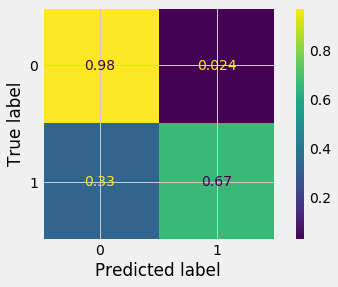

In [136]:
plot_confusion_matrix(rf_model_final, X_test_transform_df, y_test_transformed, normalize='true')

In [68]:
ft_imp_list = rf_model_final.feature_importances_.tolist()

In [69]:
ft_imp = list(zip(transformed_columns, ft_imp_list))

In [70]:
df_ft_imp = pd.DataFrame(ft_imp, columns = ['feature' , 'importance']) 

In [117]:
df_ft_imp.sort_values(by='importance',ascending=False)

,feature,importance
31,min3,0.106274
28,min2,0.068451
8,num_ops_remittance,0.057214
26,max1,0.056739
30,mean2,0.045160
15,num_pay_sanc_int,0.041772
24,monthly_loan_payment,0.040514
20,count3,0.040472
25,min1,0.040254
27,mean1,0.039726


In [72]:
# it orders the feature importances of the decision tree
# it visually shows the decision tree
eli5.show_weights(rf_model_final, feature_names=transformed_columns)

Weight,Feature
0.1063 ± 0.2800,min3
0.0685 ± 0.1888,min2
0.0572 ± 0.1498,num_ops_remittance
0.0567 ± 0.1385,max1
0.0452 ± 0.1647,mean2
0.0418 ± 0.1234,num_pay_sanc_int
0.0405 ± 0.0794,monthly_loan_payment
0.0405 ± 0.1093,count3
0.0403 ± 0.1111,min1
0.0397 ± 0.1225,mean1


## SHAP

In [73]:
rf_explainer = shap.TreeExplainer(rf_model_final)
rf_shap_values = rf_explainer.shap_values(X_train_transform_df)

In [74]:
X_train_transform_df.shape

(545, 47)

In [75]:
rf_shap_values[0].shape

(545, 47)

In [76]:
rf_shap_values[1].shape

(545, 47)

In [77]:
# This is plotting the shap values for if it will churn
shap.initjs()

#Plotting the shap values of the non churn
shap.force_plot(base_value = rf_explainer.expected_value[1],
               shap_values = rf_shap_values[1],
               feature_names = transformed_columns)

#Output value is probability; line at 50%; makes sense as there were 85% non churners and 15% churners

In [78]:
df[df['min2']==36707]

,account_id,district_id_x,stmt_frq,date_account,disp_id,client_id,type_disp,district_name,region,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,gender,birth_date,card_id,type_card,issued,loan_id,date_loan,loan_amount,loan_duration,monthly_loan_payment,target,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
118,2580,60,monthly,1995-11-09,3113,3113,OWNER,Prostejov,south Moravia,110643,49,41,4,1,4,51.9,8441,3.4,4.48,115,1879.0,2252,F,1971-11-12,NaN,NaN,NaN,5495,1996-08-02,89340,60,1489.0,0,0.0,20.0,24.0,11.0,0.0,0.0,5.0,9.0,19.0,5.0,0.0,9.0,0.0,0.0,5.0,25.0,41327,52923,45274.428571,7,36707,54020,45618.076923,13,35922,54020,44672.111111,18,2


In [79]:
X_test_transform_df.head()

,nentrep_p1000,loan_duration,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,count1,count2,count3,ratio_urban,avg_salary,loan_amount,monthly_loan_payment,min1,max1,mean1,min2,max2,mean2,min3,max3,mean3,x0_monthly,x0_weekly,x0_after_trans,x1_south Bohemia,x1_Prague,x1_central Bohemia,x1_east Bohemia,x1_south Moravia,x1_north Moravia,x1_west Bohemia,x1_north Bohemia,x2_F,x2_M
0,99.0,36.0,0.0,10.0,3.0,6.0,0.0,0.0,0.0,4.0,3.0,0.0,0.0,4.0,0.0,0.0,0.0,9.0,4.0,7.0,9.0,64.6,8819.0,182628.0,5073.0,30008.0,45661.0,40238.500000,30008.0,52246.0,41374.714286,30008.0,52246.0,41278.111111,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,81.0,60.0,0.0,12.0,10.0,7.0,0.0,0.0,2.0,5.0,8.0,1.0,0.0,5.0,0.0,0.0,1.0,15.0,8.0,11.0,14.0,89.9,10177.0,73260.0,1221.0,21163.0,53136.0,35784.500000,21163.0,53136.0,36167.000000,21163.0,58295.0,37234.285714,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,100.0,60.0,4.0,48.0,59.0,32.0,0.0,0.0,0.0,16.0,63.0,0.0,0.0,16.0,0.0,0.0,14.0,81.0,7.0,14.0,22.0,100.0,10673.0,380160.0,6336.0,22050.0,30650.0,25706.714286,22050.0,61025.0,33217.142857,22050.0,108665.0,45860.727273,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,115.0,60.0,0.0,20.0,24.0,11.0,0.0,0.0,5.0,9.0,19.0,5.0,0.0,9.0,0.0,0.0,5.0,25.0,7.0,13.0,18.0,51.9,8441.0,89340.0,1489.0,41327.0,52923.0,45274.428571,36707.0,54020.0,45618.076923,35922.0,54020.0,44672.111111,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,120.0,24.0,2.0,32.0,44.0,23.0,0.0,0.0,8.0,9.0,38.0,8.0,0.0,9.0,0.0,0.0,8.0,53.0,15.0,26.0,32.0,52.7,8402.0,125472.0,5228.0,38399.0,115711.0,72370.066667,38399.0,143697.0,82513.346154,38399.0,143697.0,83057.718750,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [80]:
df[df['target']==1]

,account_id,district_id_x,stmt_frq,date_account,disp_id,client_id,type_disp,district_name,region,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,gender,birth_date,card_id,type_card,issued,loan_id,date_loan,loan_amount,loan_duration,monthly_loan_payment,target,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
4,426,1,monthly,1993-11-29,512,512,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,F,1965-08-03,NaN,NaN,NaN,5060,1994-07-19,252060,60,4201.0,1,6.0,26.0,29.0,19.0,0.0,0.0,10.0,7.0,25.0,5.0,0.0,7.0,0.0,0.0,5.0,44.0,38545,96184,65952.818182,11,28524,96184,59215.909091,22,28524,96184,58548.483871,31,1
22,3678,1,monthly,1993-03-24,4433,4433,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1968-02-22,NaN,NaN,NaN,5724,1995-02-05,316140,60,5269.0,1,0.0,60.0,79.0,38.0,0.0,0.0,0.0,22.0,79.0,18.0,0.0,22.0,0.0,0.0,18.0,81.0,10379,23680,15345.090909,11,10379,27507,17292.235294,17,10379,27507,18521.833333,24,1
32,5213,1,monthly,1995-08-18,6299,6299,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1936-08-09,833.0,classic,1998-08-01,6063,1996-04-25,320976,48,6687.0,1,3.0,23.0,24.0,1.0,0.0,8.0,0.0,14.0,27.0,0.0,0.0,14.0,0.0,0.0,3.0,33.0,43060,90096,56018.750000,8,30114,90096,51382.214286,14,5401,90096,42887.952381,21,1
38,6118,1,weekly,1994-03-07,7390,7390,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1937-11-04,NaN,NaN,NaN,6244,1995-01-08,270648,36,7518.0,1,0.0,36.0,36.0,16.0,0.0,0.0,0.0,20.0,36.0,6.0,0.0,20.0,0.0,0.0,7.0,39.0,50997,134501,83172.888889,9,50997,134501,85603.421053,19,20235,134501,72076.296296,27,1
74,10131,1,monthly,1993-11-27,12156,12464,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1959-12-17,NaN,NaN,NaN,7066,1994-05-02,215388,36,5983.0,1,0.0,10.0,5.0,3.0,0.0,0.0,0.0,7.0,5.0,0.0,0.0,7.0,0.0,0.0,0.0,8.0,30524,30663,30593.500000,2,30524,38646,33394.500000,6,28769,38646,32258.625000,8,1
76,10451,1,monthly,1993-08-29,12551,12859,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,F,1976-05-21,NaN,NaN,NaN,7142,1994-12-19,482940,60,8049.0,1,0.0,56.0,75.0,26.0,0.0,0.0,34.0,30.0,41.0,11.0,11.0,30.0,0.0,0.0,11.0,68.0,2036,23092,12762.666667,12,2036,33283,17603.571429,21,2036,33966,19352.774194,31,1
82,11021,1,monthly,1993-08-10,13240,13548,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1976-03-18,NaN,NaN,NaN,7241,1995-03-04,168984,24,7041.0,1,8.0,74.0,78.0,36.0,0.0,0.0,0.0,38.0,86.0,0.0,0.0,38.0,0.0,2.0,18.0,102.0,10062,24304,12957.000000,6,7438,34638,15411.062500,16,7438,57872,25496.045455,22,1
100,6473,12,monthly,1993-01-26,7815,7815,OWNER,Pribram,central Bohemia,107870,84,29,6,1,6,58.0,8754,3.8,4.31,137,3804.0,3868,F,1946-01-19,NaN,NaN,NaN,6316,1994-05-26,76908,12,6409.0,1,8.0,42.0,52.0,26.0,0.0,0.0,0.0,16.0,60.0,0.0,0.0,16.0,0.0,0.0,12.0,74.0,7889,45136,27757.833333,6,7889,75627,39647.923077,13,7889,75627,36690.411765,17,1
110,5927,15,monthly,1993-11-26,7166,7166,OWNER,Cesky Krumlov,south Bohemia,58796,22,16,7,1,5,51.9,9045,3.1,3.60,124,1845.0,1879,M,1964-05-13,NaN,NaN,NaN,6210,1994-06-06,87216,48,1817.0,1,1.0,21.0,11.0,3.0,0.0,6.0,0.0,12.0,12.0,2.0,0.0,12.0,0.0,0.0,2.0,17.0,20452,38260,25607.500000,8,20452,40671,29696.500000,16,20452,41410,30873.450000,20,1
123,7824,60,monthly,1994-05-17,9367,9675,OWNER,Prostejov,south Moravia,110643,49,41,4,1,4,51.9,8441,3.4,4.48,115,1879.0,2252,F,1970-02-19,NaN,NaN,NaN,6594,1994-09-28,189696,24,7904.0,1,0.0,5.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [81]:
y_train_transformed

array([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,

In [82]:
shap.initjs()
shap.force_plot(rf_explainer.expected_value[1],
               rf_shap_values[1][22],
               features=X_train_transform_df.iloc[22,:].values,
               feature_names=transformed_columns)

#predicted to be accepted for a loan 
# its a rotated view of the previous plot per row

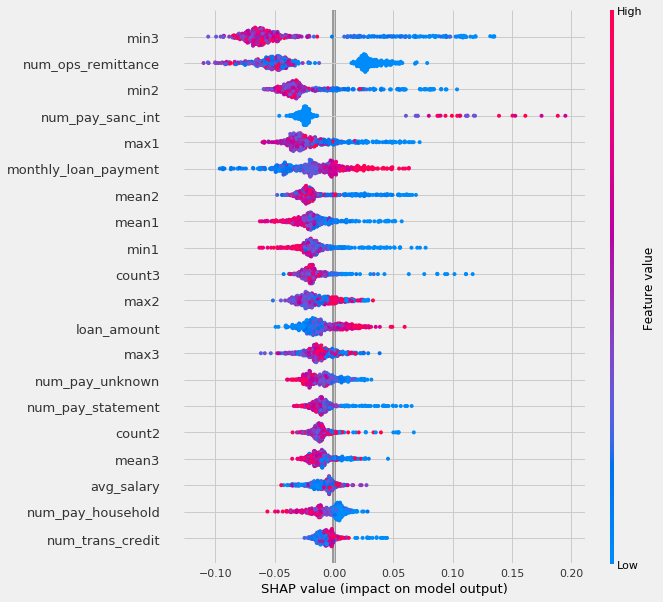

In [83]:
shap.summary_plot(rf_shap_values[1],
                 X_train_transform_df,
                 feature_names=transformed_columns)

# x-axis scale - going to 1 is churn
# the color scale is what value it is

#min 3: negatively correlated with our target variable; a low level of min 3 has a high impact on rejected loans 

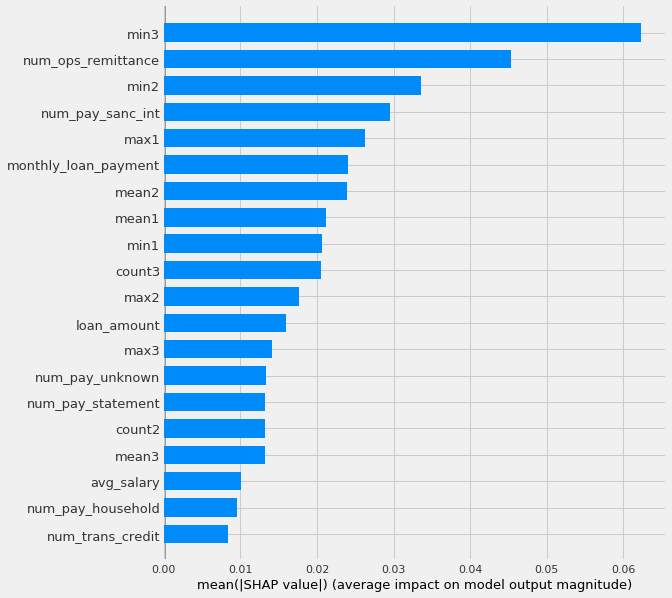

In [84]:
#This shows the mean magnitude of shap values for each variable
shap.summary_plot(rf_shap_values[1], X_train_transform_df, plot_type = 'bar')

#x-axis has an absolute sign 

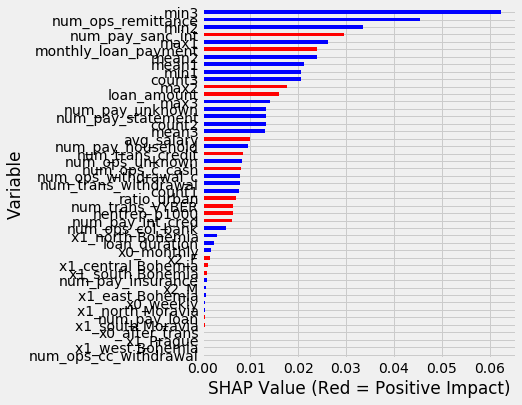

In [85]:
def ABS_SHAP(df_shap,df):
    #import matplotlib as plt
    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop('index',axis=1)
    
    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i],df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns  = ['Variable','Corr']
    corr_df['Sign'] = np.where(corr_df['Corr']>0,'red','blue')
    
    # Plot it
    shap_abs = np.abs(shap_v)
    k=pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ['Variable','SHAP_abs']
    k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable',how='inner')
    k2 = k2.sort_values(by='SHAP_abs',ascending = True)
    colorlist = k2['Sign']
    ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=(5,6),legend=False)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)")
    
ABS_SHAP(rf_shap_values[1],X_train_transform_df) 

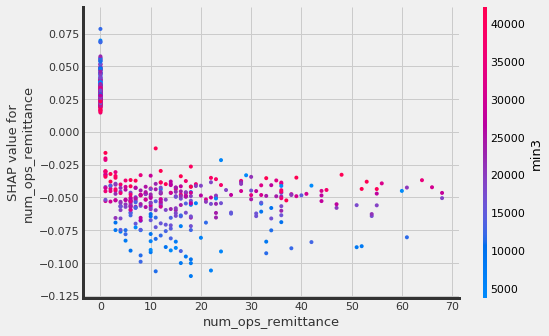

In [110]:
shap.dependence_plot('num_ops_remittance', 
                     rf_shap_values[1], 
                     features = X_train_transform_df,
                     feature_names = transformed_columns, 
                     interaction_index = 'min3'
                    )

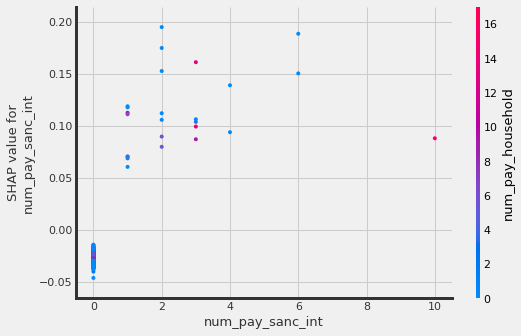

In [116]:
shap.dependence_plot('num_pay_sanc_int', 
                     rf_shap_values[1], 
                     features = X_train_transform_df,
                     feature_names = transformed_columns, 
                     #interaction_index = 'min3'
                    )

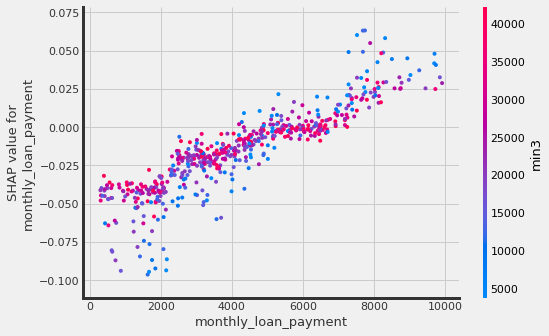

In [114]:
shap.dependence_plot('monthly_loan_payment', 
                     rf_shap_values[1], 
                     features = X_train_transform_df,
                     feature_names = transformed_columns, 
                     interaction_index = 'min3'
                    )

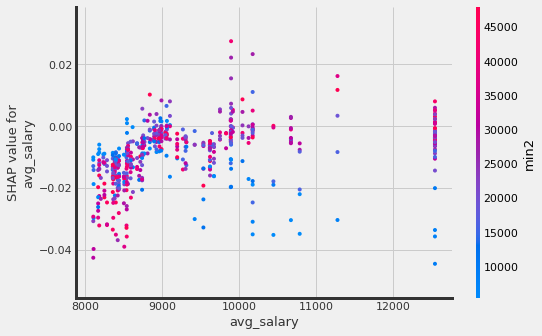

In [115]:
shap.dependence_plot('avg_salary', 
                     rf_shap_values[1], 
                     features = X_train_transform_df,
                     feature_names = transformed_columns, 
                     #interaction_index = 'min3'
                    )

In [139]:
df.groupby('target')['min3'].mean()

target
0    24954.983498
1    11293.921053
Name: min3, dtype: float64

In [141]:
df.groupby('target')['min2'].mean()

target
0    27410.429043
1    14611.039474
Name: min2, dtype: float64

In [142]:
df.groupby('target')['monthly_loan_payment'].mean()

target
0    4047.607261
1    5331.355263
Name: monthly_loan_payment, dtype: float64

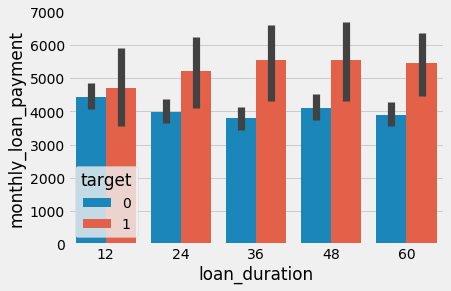

In [140]:
sns.barplot(x = 'loan_duration', y = 'monthly_loan_payment', hue='target', data=df)

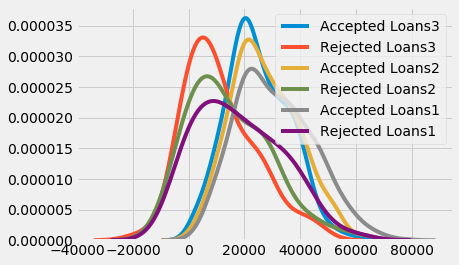

In [89]:
sns.kdeplot(df.loc[df['target']==0, 'min3'],label='Accepted Loans3')
sns.kdeplot(df.loc[df['target']==1, 'min3'],label='Rejected Loans3')

sns.kdeplot(df.loc[df['target']==0, 'min2'],label='Accepted Loans2')
sns.kdeplot(df.loc[df['target']==1, 'min2'],label='Rejected Loans2')

sns.kdeplot(df.loc[df['target']==0, 'min1'],label='Accepted Loans1')
sns.kdeplot(df.loc[df['target']==1, 'min1'],label='Rejected Loans1')

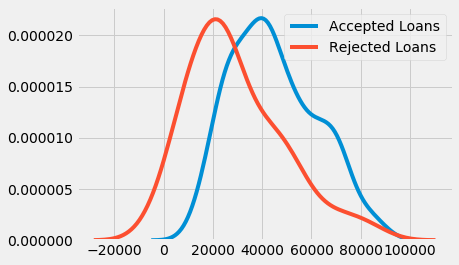

In [90]:
sns.kdeplot(df.loc[df['target']==0, 'mean2'],label='Accepted Loans')
sns.kdeplot(df.loc[df['target']==1, 'mean2'],label='Rejected Loans')

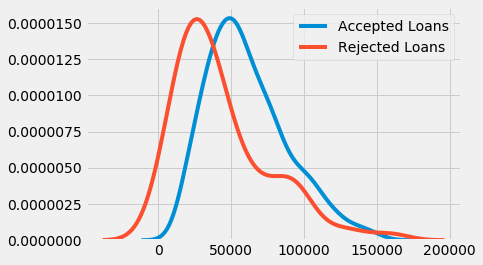

In [91]:
sns.kdeplot(df.loc[df['target']==0, 'max1'],label='Accepted Loans')
sns.kdeplot(df.loc[df['target']==1, 'max1'],label='Rejected Loans')

In [92]:
print('Average num_ops_remittance for Accepted Loans: {:.2f}'.format(df[df['target']==0]['num_ops_remittance'].mean()))
print('Average num_ops_remittance for Rejected Loans: {:.2f}'.format(df[df['target']==1]['num_ops_remittance'].mean()))

Average num_ops_remittance for Accepted Loans: 11.66
Average num_ops_remittance for Rejected Loans: 5.17


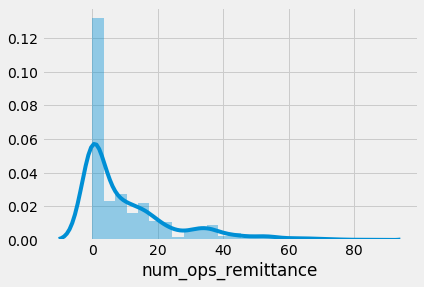

In [93]:
sns.distplot(df.num_ops_remittance)

In [94]:
print('Average num_pay_sanc_int for Accepted Loans: {:.2f}'.format(df[df['target']==0]['num_pay_sanc_int'].sum()))
print('Average num_pay_sanc_int for Rejected Loans: {:.2f}'.format(df[df['target']==1]['num_pay_sanc_int'].sum()))

Average num_pay_sanc_int for Accepted Loans: 14.00
Average num_pay_sanc_int for Rejected Loans: 68.00


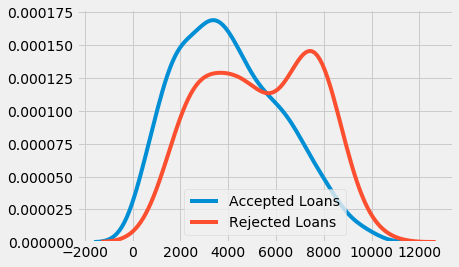

In [105]:
sns.kdeplot(df.loc[df['target']==0, 'monthly_loan_payment'],label='Accepted Loans')
sns.kdeplot(df.loc[df['target']==1, 'monthly_loan_payment'],label='Rejected Loans')

In [96]:
rf_model_final

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [97]:
# Extract single tree
estimator = rf_model_final.estimators_[12]

In [98]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = transformed_columns,
                class_names = ['good_loan','bad_loan'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [99]:
# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [100]:
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [101]:
df.head()

,account_id,district_id_x,stmt_frq,date_account,disp_id,client_id,type_disp,district_name,region,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,gender,birth_date,card_id,type_card,issued,loan_id,date_loan,loan_amount,loan_duration,monthly_loan_payment,target,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
0,2350,18,monthly,1996-08-04,2841,2841,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1973-04-10,446.0,classic,1998-06-04,5451,1997-05-11,159744,48,3328.0,0,0.0,15.0,13.0,10.0,0.0,0.0,3.0,5.0,10.0,2.0,0.0,5.0,0.0,0.0,2.0,19.0,53598,79188,69002.000000,5,41964,105954,70175.285714,14,39875,105954,68155.266667,15,1
1,9156,18,monthly,1997-09-14,10963,11271,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,M,1937-12-08,NaN,NaN,NaN,6856,1998-12-01,163332,36,4537.0,0,4.0,34.0,28.0,11.0,0.0,0.0,0.0,23.0,32.0,0.0,0.0,23.0,0.0,0.0,6.0,37.0,17501,23801,18828.200000,5,2777,28615,16541.461538,13,2777,67680,24103.263158,19,1
2,10973,18,weekly,1993-04-20,13182,13490,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1969-05-25,NaN,NaN,NaN,7235,1993-10-13,154416,48,3217.0,0,2.0,16.0,14.0,10.0,0.0,0.0,0.0,6.0,16.0,0.0,0.0,6.0,0.0,0.0,4.0,22.0,20150,56033,42202.375000,8,20150,56033,41657.083333,12,20150,70024,44007.176471,17,1
3,2,1,monthly,1993-02-26,2,2,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1945-02-04,NaN,NaN,NaN,4959,1994-01-05,80952,24,3373.0,0,3.0,22.0,30.0,2.0,0.0,10.0,6.0,10.0,27.0,6.0,0.0,10.0,0.0,0.0,6.0,33.0,16859,47213,29349.888889,9,16859,47213,30791.533333,15,16859,47213,29830.000000,20,2
4,426,1,monthly,1993-11-29,512,512,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,F,1965-08-03,NaN,NaN,NaN,5060,1994-07-19,252060,60,4201.0,1,6.0,26.0,29.0,19.0,0.0,0.0,10.0,7.0,25.0,5.0,0.0,7.0,0.0,0.0,5.0,44.0,38545,96184,65952.818182,11,28524,96184,59215.909091,22,28524,96184,58548.483871,31,1


In [102]:
df.dtypes

account_id                 int64
district_id_x              int64
stmt_frq                  object
date_account              object
disp_id                    int64
client_id                  int64
type_disp                 object
district_name             object
region                    object
population                 int64
nmu_lt499                  int64
nmu_500to1999              int64
nmu_2000to9999             int64
nmu_gt10000                int64
n_cty                      int64
ratio_urban              float64
avg_salary                 int64
unemp_95                 float64
unemp_96                 float64
nentrep_p1000              int64
ncrimes_95               float64
ncrimes_96                 int64
gender                    object
birth_date                object
card_id                  float64
type_card                 object
issued                    object
loan_id                    int64
date_loan                 object
loan_amount                int64
          

In [126]:
df.head()

,account_id,district_id_x,stmt_frq,date_account,disp_id,client_id,type_disp,district_name,region,population,nmu_lt499,nmu_500to1999,nmu_2000to9999,nmu_gt10000,n_cty,ratio_urban,avg_salary,unemp_95,unemp_96,nentrep_p1000,ncrimes_95,ncrimes_96,gender,birth_date,card_id,type_card,issued,loan_id,date_loan,loan_amount,loan_duration,monthly_loan_payment,target,num_trans_VYBER,num_trans_credit,num_trans_withdrawal,num_ops_c_cash,num_ops_cc_withdrawal,num_ops_col_bank,num_ops_remittance,num_ops_unknown,num_ops_withdrawal_c,num_pay_household,num_pay_insurance,num_pay_int_cred,num_pay_loan,num_pay_sanc_int,num_pay_statement,num_pay_unknown,min1,max1,mean1,count1,min2,max2,mean2,count2,min3,max3,mean3,count3,num_clients
0,2350,18,monthly,1996-08-04,2841,2841,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1973-04-10,446.0,classic,1998-06-04,5451,1997-05-11,159744,48,3328.0,0,0.0,15.0,13.0,10.0,0.0,0.0,3.0,5.0,10.0,2.0,0.0,5.0,0.0,0.0,2.0,19.0,53598,79188,69002.000000,5,41964,105954,70175.285714,14,39875,105954,68155.266667,15,1
1,9156,18,monthly,1997-09-14,10963,11271,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,M,1937-12-08,NaN,NaN,NaN,6856,1998-12-01,163332,36,4537.0,0,4.0,34.0,28.0,11.0,0.0,0.0,0.0,23.0,32.0,0.0,0.0,23.0,0.0,0.0,6.0,37.0,17501,23801,18828.200000,5,2777,28615,16541.461538,13,2777,67680,24103.263158,19,1
2,10973,18,weekly,1993-04-20,13182,13490,OWNER,Pisek,south Bohemia,70699,60,13,2,1,4,65.3,8968,2.8,3.35,131,1740.0,1910,F,1969-05-25,NaN,NaN,NaN,7235,1993-10-13,154416,48,3217.0,0,2.0,16.0,14.0,10.0,0.0,0.0,0.0,6.0,16.0,0.0,0.0,6.0,0.0,0.0,4.0,22.0,20150,56033,42202.375000,8,20150,56033,41657.083333,12,20150,70024,44007.176471,17,1
3,2,1,monthly,1993-02-26,2,2,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,M,1945-02-04,NaN,NaN,NaN,4959,1994-01-05,80952,24,3373.0,0,3.0,22.0,30.0,2.0,0.0,10.0,6.0,10.0,27.0,6.0,0.0,10.0,0.0,0.0,6.0,33.0,16859,47213,29349.888889,9,16859,47213,30791.533333,15,16859,47213,29830.000000,20,2
4,426,1,monthly,1993-11-29,512,512,OWNER,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.2,0.43,167,85677.0,99107,F,1965-08-03,NaN,NaN,NaN,5060,1994-07-19,252060,60,4201.0,1,6.0,26.0,29.0,19.0,0.0,0.0,10.0,7.0,25.0,5.0,0.0,7.0,0.0,0.0,5.0,44.0,38545,96184,65952.818182,11,28524,96184,59215.909091,22,28524,96184,58548.483871,31,1
